In [2]:
import sys
import os 
sys.path.append(os.path.abspath(os.path.join("", "..")))
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
from torch import nn
from vanilla_vae import VanillaVAE
import wandb
device = "cuda:0"

### Step 1: Load the data & Create dataloader

In [3]:
weights_path = '../../weights2weights/weights_datasets/identities/all_weights.pt'
all_weights = torch.load(weights_path, map_location=torch.device("cpu"))

In [4]:
print(f"all_weights shape: {all_weights.shape}")

tensor = all_weights[0]
size_in_bytes = tensor.element_size() * tensor.numel()

# Convert to gigabytes
size_in_gb = size_in_bytes / (1024 ** 3)
print(f"Size of the all_weights in GB: {size_in_gb * len(all_weights):.6f} GB")

all_weights shape: torch.Size([64974, 99648])
Size of the all_weights in GB: 24.119501 GB


In [5]:
class w2wDataset(Dataset):
    def __init__(self, all_weights):
        self.all_weights = all_weights
        
    def __len__(self):
        return len(self.all_weights)
    
    def __getitem__(self, idx):
        return self.all_weights[idx]
    
train_ratio = 0.8
test_ratio = 0.1
val_ratio = 0.1
batch_size = 32

# Calculate the sizes of the splits
train_size = int(train_ratio * len(all_weights))
test_size = int(test_ratio * len(all_weights))
val_size = len(all_weights) - train_size - test_size

# Split the dataset
full_dataset = w2wDataset(all_weights)
train_dataset, test_dataset, val_dataset = torch.utils.data.random_split(full_dataset, [train_size, test_size, val_size])

# Create the dataloaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

In [6]:
len(train_loader), len(test_loader), len(val_loader)

(1625, 204, 204)

### Step 2: Create the model

In [7]:
in_dim = len(all_weights[0])
latent_dim = 32
hidden_dims = [1024, 512, 256, 128, 64]

vae = VanillaVAE(in_dim, latent_dim, hidden_dims).to(device)
vae.train()

VanillaVAE(
  (encoder): Sequential(
    (0): Sequential(
      (0): Linear(in_features=99648, out_features=1024, bias=True)
      (1): LeakyReLU(negative_slope=0.01)
    )
    (1): Sequential(
      (0): Linear(in_features=1024, out_features=512, bias=True)
      (1): LeakyReLU(negative_slope=0.01)
    )
    (2): Sequential(
      (0): Linear(in_features=512, out_features=256, bias=True)
      (1): LeakyReLU(negative_slope=0.01)
    )
    (3): Sequential(
      (0): Linear(in_features=256, out_features=128, bias=True)
      (1): LeakyReLU(negative_slope=0.01)
    )
    (4): Sequential(
      (0): Linear(in_features=128, out_features=64, bias=True)
      (1): LeakyReLU(negative_slope=0.01)
    )
  )
  (fc_mu): Linear(in_features=64, out_features=32, bias=True)
  (fc_var): Linear(in_features=64, out_features=32, bias=True)
  (decoder_input): Linear(in_features=32, out_features=64, bias=True)
  (decoder): Sequential(
    (0): Sequential(
      (0): Linear(in_features=64, out_features=128

### Step 3: Train model

In [8]:
def evaluate(dataloader, dataname, vae):
    size = len(dataloader.dataset)
    vae.eval()
    avg_loss = 0
    with torch.no_grad():
        for weights in dataloader:
            weights = weights.to(device)
            recon, mu, log_var = vae(weights)
            avg_loss += vae.loss(weights, recon, mu, log_var).item()
    avg_loss /= size
    print(f"{dataname} avg loss = {avg_loss:>8f}")
    return avg_loss

In [9]:
epochs = 5
optimizer = torch.optim.Adam(vae.parameters(), lr=1e-3)

wandb.init(
        project="w2w-proj",
        name="vanilla-vae-attempt2",
    )

# Training loop
for epoch in range(epochs):
    vae.train()
    cur_num_examples = 0
    for i, weights in enumerate(train_loader):
        weights = weights.to(device)
        optimizer.zero_grad()
        recon, mu, log_var = vae(weights)
        
        loss = vae.loss(weights, recon, mu, log_var)
        loss.backward()
        optimizer.step()
        if i % 500 == 0:
            print(f"Epoch[{epoch}/{epochs}], Step [{i}/{len(train_loader)}], Loss: {loss.item():.8f}")

        cur_num_examples += weights.shape[0]
        wandb.log({"Num of examples seen": epoch*len(train_loader.dataset) + cur_num_examples, 
                    "Loss": loss})

    print(f"Epoch[{epoch}/{epochs}]")
    train_avg_loss = evaluate(train_loader, "Train", vae)
    test_avg_loss = evaluate(test_loader, "Test", vae)
    val_avg_loss = evaluate(val_loader, "Validation", vae)

    wandb.log({"Epoch": epoch,
                "Train Avg Loss": train_avg_loss, 
                "Test Avg Loss": test_avg_loss,
                "Validation Avg Loss": val_avg_loss,})

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: yiningshe (yiningshe-carnegie-mellon-university). Use `wandb login --relogin` to force relogin


Epoch[0/5], Step [0/1625], Loss: 4.09411573
Epoch[0/5], Step [500/1625], Loss: 0.00006481
Epoch[0/5], Step [1000/1625], Loss: 0.00014393
Epoch[0/5], Step [1500/1625], Loss: 0.00006595
Epoch[0/5]
Train avg loss = 0.000008
Test avg loss = 0.000008
Validation avg loss = 0.000008
Epoch[1/5], Step [0/1625], Loss: 0.00028512
Epoch[1/5], Step [500/1625], Loss: 0.00016553
Epoch[1/5], Step [1000/1625], Loss: 0.00012861
Epoch[1/5], Step [1500/1625], Loss: 0.00020219
Epoch[1/5]
Train avg loss = 0.000016
Test avg loss = 0.000016
Validation avg loss = 0.000016
Epoch[2/5], Step [0/1625], Loss: 0.00053414
Epoch[2/5], Step [500/1625], Loss: 0.00019052
Epoch[2/5], Step [1000/1625], Loss: 0.00004487
Epoch[2/5], Step [1500/1625], Loss: 0.00009390
Epoch[2/5]
Train avg loss = 0.000004
Test avg loss = 0.000004
Validation avg loss = 0.000004
Epoch[3/5], Step [0/1625], Loss: 0.00012431
Epoch[3/5], Step [500/1625], Loss: 0.00007658
Epoch[3/5], Step [1000/1625], Loss: 0.00003710
Epoch[3/5], Step [1500/1625], Lo

In [47]:
# save model
vae_save_path = "./outputs/vanilla_vae_attempt1/"
torch.save(vae.state_dict(), vae_save_path+"vae.pt")

### Step 4: Sample a weight using the trained VAE

In [76]:
vae.eval()
results = vae.sample(20, device)
torch.save(results, vae_save_path+'vae-samples.pt')

In [60]:
# for building diffusion model 
file_path = '../../weights2weights/files/'
weight_dimensions = torch.load(file_path+"/weight_dimensions.pt")

# unflatten one weight to normal diffusion model format
from utils import unflatten
unflatten(results[[3]], weight_dimensions, vae_save_path)

### Step 5: Image generation with the sampled weight

In [61]:
from PIL import Image
from lora_w2w import LoRAw2w
from diffusers import DiffusionPipeline 
from peft import PeftModel
from peft.utils.save_and_load import load_peft_weights

In [62]:
pipe = DiffusionPipeline.from_pretrained("stablediffusionapi/realistic-vision-v51", 
                                         torch_dtype=torch.float16,safety_checker = None,
                                         requires_safety_checker = False).to(device)
   
pipe.unet = PeftModel.from_pretrained(pipe.unet, vae_save_path+"/unet", adapter_name="identity1")
adapters_weights1 = load_peft_weights(vae_save_path+"/unet", device="cuda:0")
pipe.unet.load_state_dict(adapters_weights1, strict = False)
pipe.to(device)
print("")

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

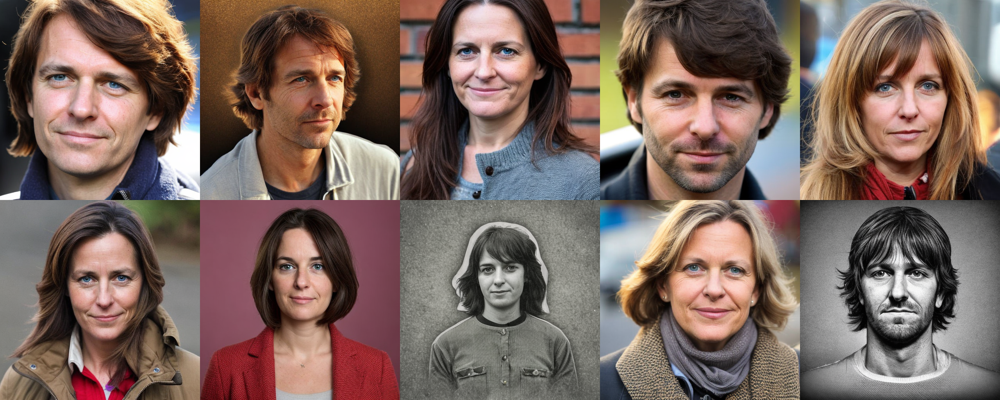

In [63]:
#random seed generator
images = []
for i in range(10):
    generator = torch.Generator(device=device)
    generator = generator.manual_seed(i)
    latents = torch.randn(
            (1, pipe.unet.in_channels, 512 // 8, 512 // 8),
            generator = generator,
            device = device
        ).half()

    #inference parameters
    prompt = "sks person"
    negative_prompt = "low quality, blurry, unfinished"
    guidance_scale = 3.0
    ddim_steps = 50
    #run inference
    image = pipe(prompt, num_inference_steps=ddim_steps, guidance_scale=guidance_scale,  negative_prompt=negative_prompt, latents = latents ).images[0]
    images.append(image)

### display images
w, h = 512,512
grid = Image.new('RGB', size=(5*512, 2*512))
grid_w, grid_h = grid.size
for i, img in enumerate(images):
    grid.paste(img, box=(i%5*w, i//5*h))
grid

### Optional: Image generation with an original weight from w2w dataset

In [65]:
# pick a weight from the weight dataset
idx = 8
path_gt = './outputs/example'
model_gt = all_weights[idx, :].unsqueeze(0).clone().to(device)
unflatten(model_gt, weight_dimensions, path_gt)

pipe_gt = DiffusionPipeline.from_pretrained("stablediffusionapi/realistic-vision-v51", 
                                         torch_dtype=torch.float16,safety_checker = None,
                                         requires_safety_checker = False).to(device)
   
pipe_gt.unet = PeftModel.from_pretrained(pipe_gt.unet, path_gt+"/unet", adapter_name="identity1")
adapters_weights1 = load_peft_weights(path_gt+"/unet", device="cuda:0")
pipe_gt.unet.load_state_dict(adapters_weights1, strict = False)
pipe_gt.to(device)
print("")

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

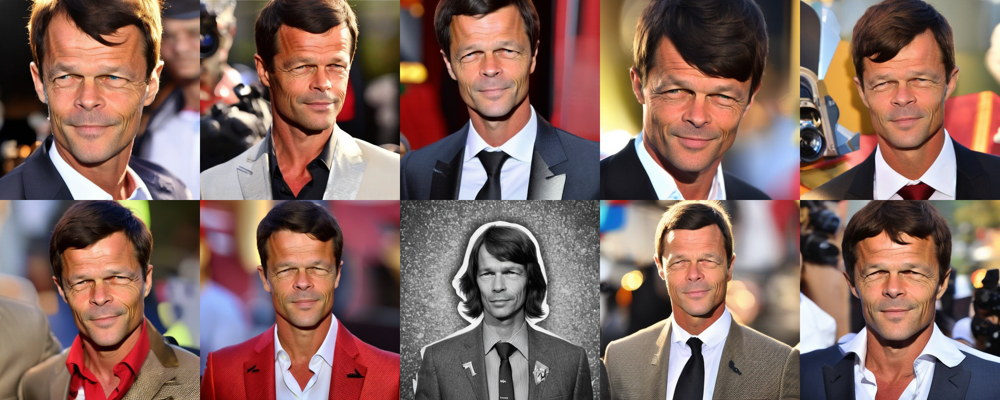

In [67]:
#random seed generator
images = []
for i in range(10):
    generator = torch.Generator(device=device)
    generator = generator.manual_seed(i)
    latents = torch.randn(
            (1, pipe_gt.unet.in_channels, 512 // 8, 512 // 8),
            generator = generator,
            device = device
        ).half()

    #inference parameters
    prompt = "sks person"
    negative_prompt = "low quality, blurry, unfinished"
    guidance_scale = 3.0
    ddim_steps = 50
    #run inference
    image = pipe_gt(prompt, num_inference_steps=ddim_steps, guidance_scale=guidance_scale,  negative_prompt=negative_prompt, latents = latents ).images[0]
    images.append(image)

### display images
w, h = 512,512
grid = Image.new('RGB', size=(5*512, 2*512))
grid_w, grid_h = grid.size
for i, img in enumerate(images):
    grid.paste(img, box=(i%5*w, i//5*h))
grid